In [11]:
from IPython.display import Image
Image(url="https://dezyre.gumlet.io/images/blog/churn-models/Customer_Churn_Prediction_Models_in_Machine_Learning.png?w=1100&dpr=1.0", height=250)

# Business Problem:
# The problem is to predict which customers are likely to leave the bank's credit card services (churn) based on their characteristics, so the bank can proactively offer them better services and retain them.

In [12]:
# RUN THESE CELLS TO START THE PROJECT!
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Basic starter data search:
# import pd
# head, info, describe, isna


In [13]:
df = pd.read_csv('BankChurners.csv')

In [14]:
df.head(25)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311,0.000055,0.999940
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066,0.000123,0.999880
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048,0.000086,0.999910
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113,0.000045,0.999960
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144,0.000303,0.999700


# Identified some potential columns that are 'string' which could be useful features if numerical: 
# Gender, Income_Category, Attrition_Flag

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [16]:
df.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.159997,0.840003
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.365301,0.365301
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000008,0.000420
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,0.000099,0.999660
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,0.000181,0.999820
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,0.000337,0.999900
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,0.999580,0.999990


In [17]:
df.isna().sum()

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

# Begin with simple comparative EDA 


/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='Attrition_Flag', ylabel='count'>

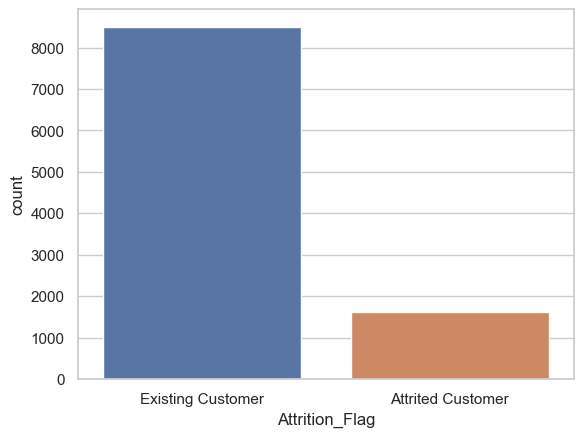

In [135]:
sns.set(style="whitegrid")
sns.countplot(data=df, x='Attrition_Flag')

# Dataset is heavily imbalanced which will potentially lean models towards Attrited Customer. 

# Models will need to be able to handle imbalanced (such as Logistic Regression)

In [19]:
df['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

# Violin plot shows that attrited customers with slightly higher credit limit than existing.

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='Attrition_Flag', ylabel='Credit_Limit'>

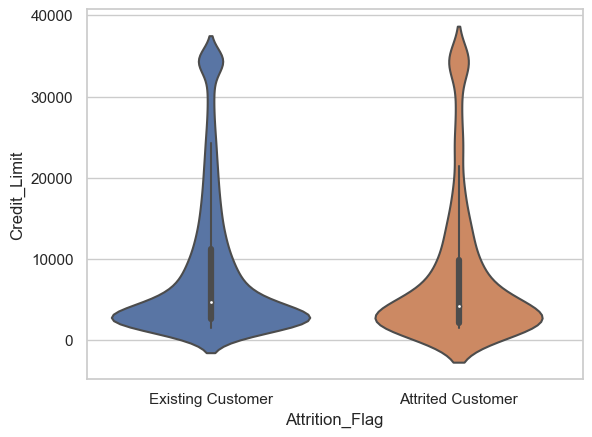

In [136]:
sns.set(style="whitegrid")
sns.violinplot(data=df, x='Attrition_Flag', y='Credit_Limit')

## Customers with higher amount of transactions on their cards are "existing"

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Ct'>

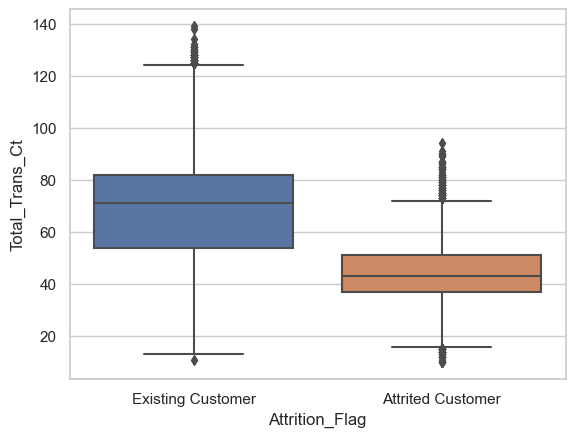

In [134]:
sns.set(style="whitegrid")
sns.boxplot(data=df, x='Attrition_Flag', y='Total_Trans_Ct')

# Highest total amounts of 'Months On Books' are the Blue and Platinum card category. 
# Analysis can be teaching that the starter cards are a great pull for customers looking to build credit.
# And the platinum is the other best alternative most likely due to higher credit limits and better incentives.

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='Months_on_book', ylabel='Card_Category'>

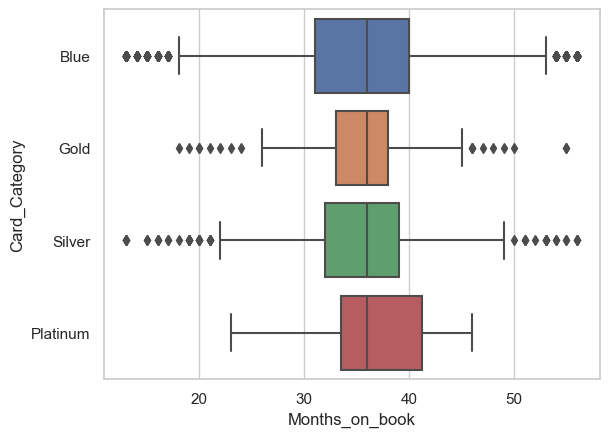

In [133]:
sns.set(style="whitegrid")
sns.boxplot(data=df,y='Card_Category', x='Months_on_book')


# Use get_dummies for Income_Category', 'Education_Level', 'Marital_Status  to be numerical values as this can be important features.  



In [24]:
# Use get_dummies to convert categorical columns to numeric
df = pd.get_dummies(df, columns=['Income_Category', 'Education_Level', 'Marital_Status'], drop_first=True)




In [25]:
df.head(15)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Income_Category_Unknown,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,768805383,Existing Customer,45,M,3,Blue,39,5,1,3,...,False,False,False,True,False,False,False,True,False,False
1,818770008,Existing Customer,49,F,5,Blue,44,6,1,2,...,False,False,True,False,False,False,False,False,True,False
2,713982108,Existing Customer,51,M,3,Blue,36,4,1,0,...,False,False,True,False,False,False,False,True,False,False
3,769911858,Existing Customer,40,F,4,Blue,34,3,4,1,...,False,False,False,True,False,False,False,False,False,True
4,709106358,Existing Customer,40,M,3,Blue,21,5,1,0,...,False,False,False,False,False,True,False,True,False,False
5,713061558,Existing Customer,44,M,2,Blue,36,3,1,2,...,False,False,True,False,False,False,False,True,False,False
6,810347208,Existing Customer,51,M,4,Gold,46,6,1,3,...,False,False,False,False,False,False,True,True,False,False
7,818906208,Existing Customer,32,M,0,Silver,27,2,2,2,...,False,False,False,True,False,False,False,False,False,True
8,710930508,Existing Customer,37,M,3,Blue,36,5,2,0,...,False,False,False,False,False,True,False,False,True,False
9,719661558,Existing Customer,48,M,2,Blue,36,6,3,3,...,False,False,True,False,False,False,False,False,True,False


In [26]:
# Convert boolean columns to integers (1 and 0)
df[['Income_Category_Unknown', 'Education_Level_Doctorate', 'Education_Level_Graduate',
    'Education_Level_High School', 'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
    'Education_Level_Unknown', 'Marital_Status_Married', 'Marital_Status_Single',
    'Marital_Status_Unknown']] = df[['Income_Category_Unknown', 'Education_Level_Doctorate',
                                     'Education_Level_Graduate', 'Education_Level_High School',
                                     'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
                                     'Education_Level_Unknown', 'Marital_Status_Married',
                                     'Marital_Status_Single', 'Marital_Status_Unknown']].astype(int)


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 34 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [28]:
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Income_Category_Unknown,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,768805383,Existing Customer,45,M,3,Blue,39,5,1,3,...,0,0,0,1,0,0,0,1,0,0
1,818770008,Existing Customer,49,F,5,Blue,44,6,1,2,...,0,0,1,0,0,0,0,0,1,0
2,713982108,Existing Customer,51,M,3,Blue,36,4,1,0,...,0,0,1,0,0,0,0,1,0,0
3,769911858,Existing Customer,40,F,4,Blue,34,3,4,1,...,0,0,0,1,0,0,0,0,0,1
4,709106358,Existing Customer,40,M,3,Blue,21,5,1,0,...,0,0,0,0,0,1,0,1,0,0
5,713061558,Existing Customer,44,M,2,Blue,36,3,1,2,...,0,0,1,0,0,0,0,1,0,0
6,810347208,Existing Customer,51,M,4,Gold,46,6,1,3,...,0,0,0,0,0,0,1,1,0,0
7,818906208,Existing Customer,32,M,0,Silver,27,2,2,2,...,0,0,0,1,0,0,0,0,0,1
8,710930508,Existing Customer,37,M,3,Blue,36,5,2,0,...,0,0,0,0,0,1,0,0,1,0
9,719661558,Existing Customer,48,M,2,Blue,36,6,3,3,...,0,0,1,0,0,0,0,0,1,0


# Add Gender_Code to be Gender numerical value as this can be an important feature.
## Male: 1
## Female: 2

In [29]:
# Create a new column 'Gender_Code' based on 'Gender'
df['Gender_Code'] = df['Gender'].map({'M': 1, 'F': 2})

# Display the updated DataFrame
print(df[['Gender', 'Gender_Code']].head())

  Gender  Gender_Code
0      M            1
1      F            2
2      M            1
3      F            2
4      M            1


## Drop Useless Columns and "ClientNum"

In [30]:
# Drop the specified column
df = df.drop("Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2", axis=1)


In [31]:
df = df.drop("Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", axis=1)

In [32]:
df = df.drop("CLIENTNUM", axis=1)

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Attrition_Flag                  10127 non-null  object 
 1   Customer_Age                    10127 non-null  int64  
 2   Gender                          10127 non-null  object 
 3   Dependent_count                 10127 non-null  int64  
 4   Card_Category                   10127 non-null  object 
 5   Months_on_book                  10127 non-null  int64  
 6   Total_Relationship_Count        10127 non-null  int64  
 7   Months_Inactive_12_mon          10127 non-null  int64  
 8   Contacts_Count_12_mon           10127 non-null  int64  
 9   Credit_Limit                    10127 non-null  float64
 10  Total_Revolving_Bal             10127 non-null  int64  
 11  Avg_Open_To_Buy                 10127 non-null  float64
 12  Total_Amt_Chng_Q4_Q1            

# Review Current columns

In [34]:
df.head(5)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,0,1,0,0,0,1,0,0,1
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,0,1,0,0,0,0,0,1,0,2
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,0,1,0,0,0,0,1,0,0,1
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,0,1,0,0,0,0,0,1,2
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,0,1,0,1,0,0,1


# Add Attrited Customer column to have a numerical value represented to use as a potential Target value. 
## Attrited Customer: 1
## Existing Customer: 0

In [35]:
# Create the 'Existing_Customer' column
df['Attrition_Customer'] = df['Attrition_Flag'].apply(lambda x: 1 if x == 'Attrited Customer' else 0)


## Check Columns 

In [36]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code,Attrition_Customer
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,1,0,0,0,1,0,0,1,0
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,1,0,0,0,0,0,1,0,2,0
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,1,0,0,0,0,1,0,0,1,0
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,1,0,0,0,0,0,1,2,0
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,1,0,1,0,0,1,0


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Attrition_Flag                  10127 non-null  object 
 1   Customer_Age                    10127 non-null  int64  
 2   Gender                          10127 non-null  object 
 3   Dependent_count                 10127 non-null  int64  
 4   Card_Category                   10127 non-null  object 
 5   Months_on_book                  10127 non-null  int64  
 6   Total_Relationship_Count        10127 non-null  int64  
 7   Months_Inactive_12_mon          10127 non-null  int64  
 8   Contacts_Count_12_mon           10127 non-null  int64  
 9   Credit_Limit                    10127 non-null  float64
 10  Total_Revolving_Bal             10127 non-null  int64  
 11  Avg_Open_To_Buy                 10127 non-null  float64
 12  Total_Amt_Chng_Q4_Q1            

# Use VarianceThreshold to select high variance features

In [38]:
from sklearn.feature_selection import VarianceThreshold

# Selecting only numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()

# Creating a DataFrame with only numerical columns
X_numeric = df[numerical_columns]

# Using VarianceThreshold
variance_threshold = 0.1  # You can adjust this threshold based on your preference
selector = VarianceThreshold(threshold=variance_threshold)

# Fit and transform the data
X_high_variance = selector.fit_transform(X_numeric)

# Get the selected features
selected_features = X_numeric.columns[selector.get_support()]

# Display the selected features
print("Selected Features:", selected_features)






Selected Features: Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Marital_Status_Married', 'Marital_Status_Single', 'Gender_Code',
       'Attrition_Customer'],
      dtype='object')


# Display heat map to show any correlations to Attrition Customers.

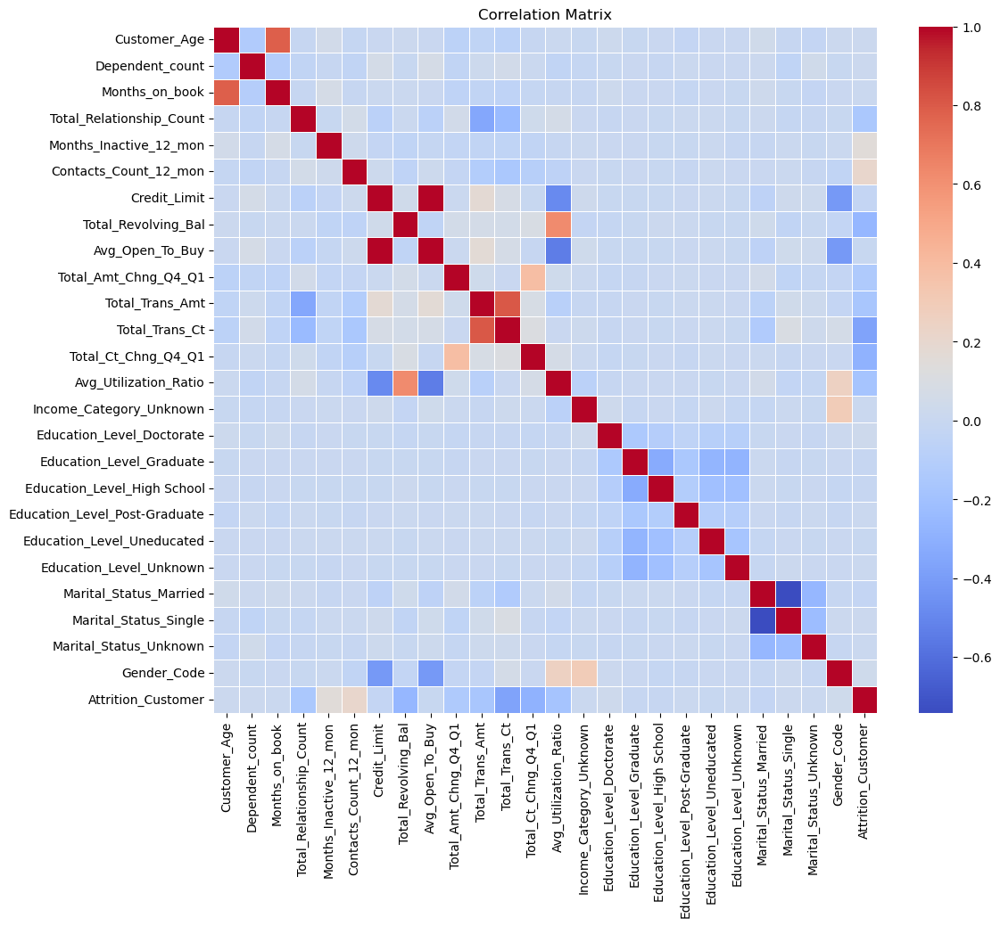

In [39]:
# Assuming df is your DataFrame
# If you have non-numeric columns, you might want to encode or drop them before creating the correlation matrix

# For example, drop non-numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Compute the correlation matrix
correlation_matrix = df_numeric.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, cmap='coolwarm', linewidths=.5)

# Display the plot
plt.title('Correlation Matrix')
plt.show()

# Highest correlation value for Attrition customers is 'Contacts_Count_12_mon'
## With this correlation its possible that these were unhappy customers making calls to the bank. 
## This category is followed most closely in correlation to 'Months_Inactive_12_mon'

In [140]:
df_numeric.corr()['Attrition_Customer'].sort_values()

Total_Trans_Ct                  -0.371403
Total_Ct_Chng_Q4_Q1             -0.290054
Total_Revolving_Bal             -0.263053
Avg_Utilization_Ratio           -0.178410
Total_Trans_Amt                 -0.168598
Total_Relationship_Count        -0.150005
Total_Amt_Chng_Q4_Q1            -0.131063
Credit_Limit                    -0.023873
Marital_Status_Married          -0.023735
Education_Level_High School     -0.011730
Education_Level_Graduate        -0.009046
Education_Level_Uneducated      -0.001444
Avg_Open_To_Buy                 -0.000285
Income_Category_Unknown          0.007179
Marital_Status_Unknown           0.008904
Education_Level_Unknown          0.009005
Education_Level_Post-Graduate    0.011127
Months_on_book                   0.013687
Customer_Age                     0.018203
Dependent_count                  0.018991
Marital_Status_Single            0.019037
Education_Level_Doctorate        0.029386
Gender_Code                      0.037272
Months_Inactive_12_mon           0

# Potential Features to be used and trained on models based on .corr 

# Contacts_Count_12_mon, Months_Inactive_12_mon, Gender_Code, Marital_Status_Single, Dependent_count, Customer_Age

# Count of people and the 12 month count of how long their cards were inactive.

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Figure size 1000x600 with 0 Axes>

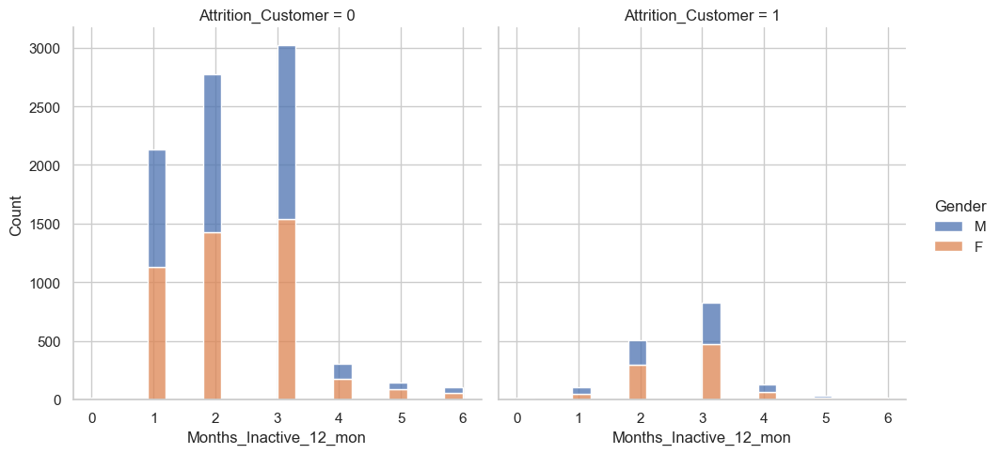

In [367]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.displot(df, x='Months_Inactive_12_mon', hue='Gender', col='Attrition_Customer', multiple='stack', bins=20)
plt.show()


# Check correlation of 'Contact_Count_12_mon'

In [142]:
df_numeric.corr()['Contacts_Count_12_mon'].sort_values()

Total_Trans_Ct                  -0.152213
Total_Trans_Amt                 -0.112774
Total_Ct_Chng_Q4_Q1             -0.094997
Avg_Utilization_Ratio           -0.055471
Total_Revolving_Bal             -0.053913
Dependent_count                 -0.040505
Gender_Code                     -0.039987
Total_Amt_Chng_Q4_Q1            -0.024445
Customer_Age                    -0.018452
Months_on_book                  -0.010774
Marital_Status_Unknown          -0.009562
Education_Level_Post-Graduate   -0.006878
Education_Level_High School     -0.003927
Education_Level_Doctorate       -0.001016
Education_Level_Unknown          0.000843
Marital_Status_Married           0.001598
Income_Category_Unknown          0.002195
Education_Level_Graduate         0.002660
Marital_Status_Single            0.007997
Education_Level_Uneducated       0.012596
Credit_Limit                     0.020817
Avg_Open_To_Buy                  0.025646
Months_Inactive_12_mon           0.029493
Total_Relationship_Count         0

# Count of people and the 12 month count of times they contacted their banks.
## With this visual it should be recommended to the bank to flag amount of time that a negative call is made and this can be a determining factor to predict customer attrition.

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Figure size 2000x1200 with 0 Axes>

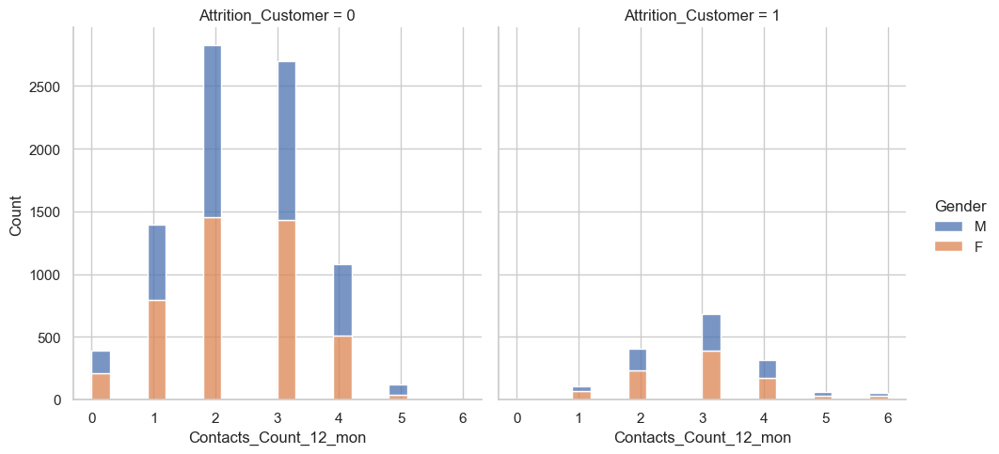

In [366]:
plt.figure(figsize=(10, 6),dpi=200)
sns.set(style="whitegrid")
sns.displot(df, x='Contacts_Count_12_mon', hue='Gender', col='Attrition_Customer', multiple='stack', bins=20)
plt.show()

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Attrition_Flag                  10127 non-null  object  
 1   Customer_Age                    10127 non-null  int64   
 2   Gender                          10127 non-null  object  
 3   Dependent_count                 10127 non-null  int64   
 4   Card_Category                   10127 non-null  object  
 5   Months_on_book                  10127 non-null  int64   
 6   Total_Relationship_Count        10127 non-null  int64   
 7   Months_Inactive_12_mon          10127 non-null  int64   
 8   Contacts_Count_12_mon           10127 non-null  int64   
 9   Credit_Limit                    10127 non-null  float64 
 10  Total_Revolving_Bal             10127 non-null  int64   
 11  Avg_Open_To_Buy                 10127 non-null  float64 
 12  Total_Amt_Chng_Q4_

# Check to see if there was any trend on spend between male and female 
# Data showed higher utilization from Woman and higher credit limits from Men. 

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Credit_Limit', ylabel='Avg_Utilization_Ratio'>

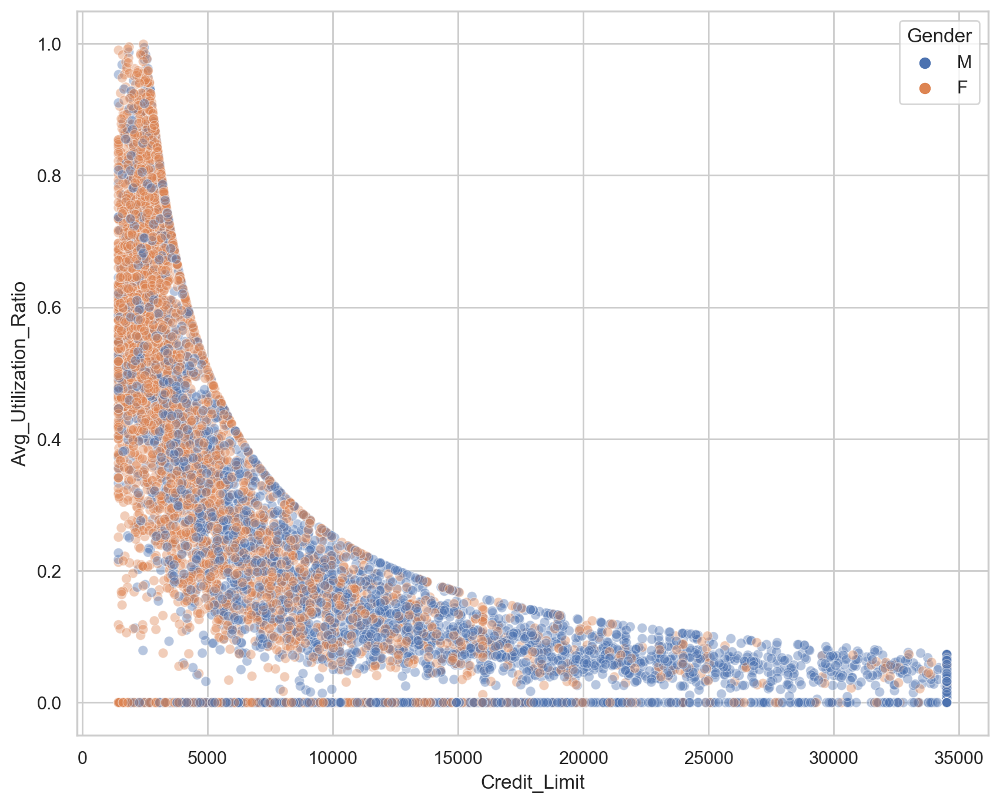

In [145]:
plt.figure(figsize=(10,8),dpi=200)
sns.scatterplot(data=df, x='Credit_Limit', y='Avg_Utilization_Ratio', hue='Gender', alpha=0.4)


In [137]:
df.head(15)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code,Attrition_Customer
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,1,0,0,0,1,0,0,1,0
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,1,0,0,0,0,0,1,0,2,0
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,1,0,0,0,0,1,0,0,1,0
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,1,0,0,0,0,0,1,2,0
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,1,0,1,0,0,1,0
5,Existing Customer,44,M,2,Blue,36,3,1,2,4010.0,...,1,0,0,0,0,1,0,0,1,0
6,Existing Customer,51,M,4,Gold,46,6,1,3,34516.0,...,0,0,0,0,1,1,0,0,1,0
7,Existing Customer,32,M,0,Silver,27,2,2,2,29081.0,...,0,1,0,0,0,0,0,1,1,0
8,Existing Customer,37,M,3,Blue,36,5,2,0,22352.0,...,0,0,0,1,0,0,1,0,1,0
9,Existing Customer,48,M,2,Blue,36,6,3,3,11656.0,...,1,0,0,0,0,0,1,0,1,0


# Higher total count of attrition and existing from woman customers 

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

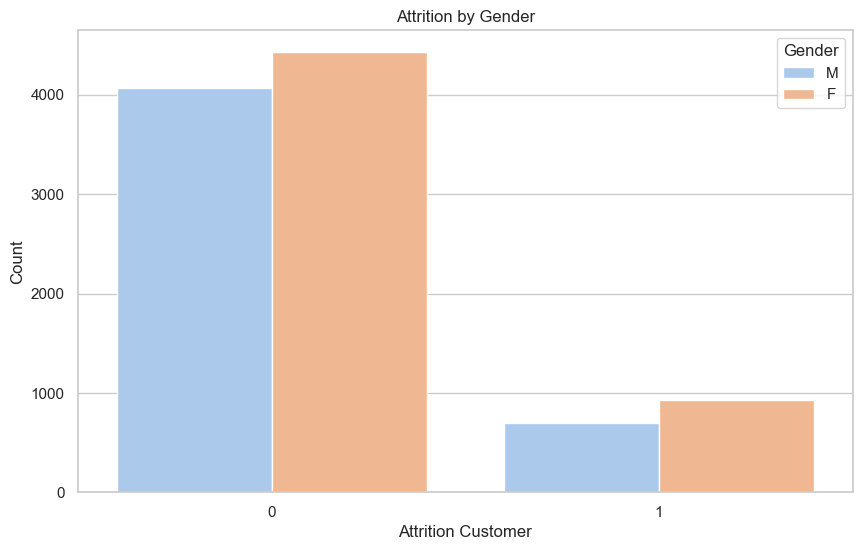

In [382]:
# Create a stacked bar chart
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Attrition_Customer', hue='Gender', palette='pastel')
plt.title('Attrition by Gender')
plt.xlabel('Attrition Customer')
plt.ylabel('Count')
plt.show()

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

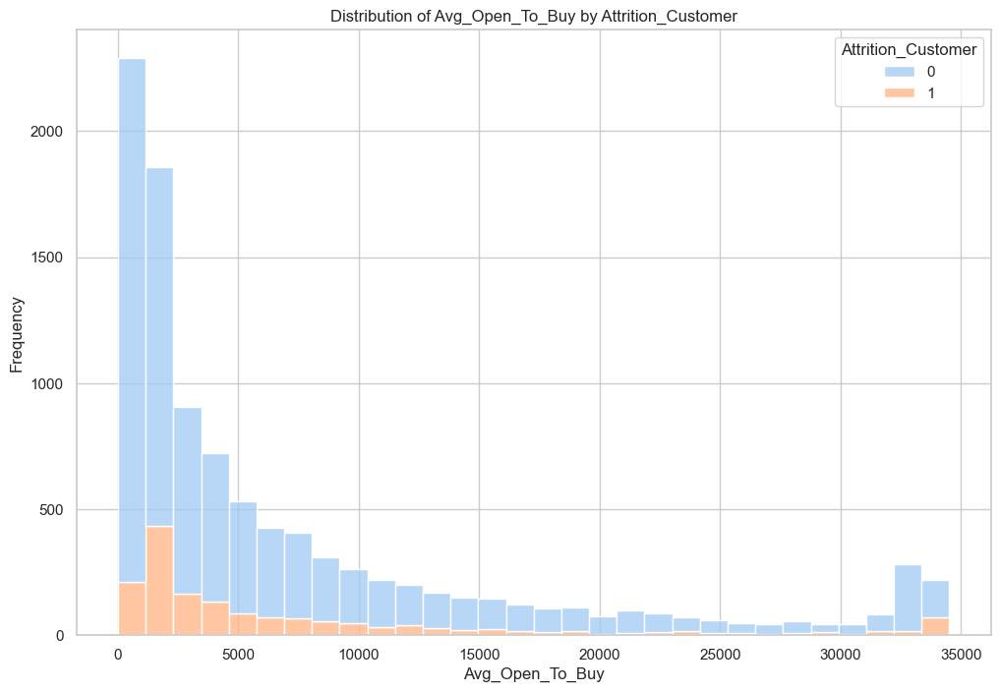

In [389]:
# Assuming df is your DataFrame with 'Avg_Open_To_Buy' and 'Attrition_Customer' columns
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='Avg_Open_To_Buy', bins=30, hue='Attrition_Customer', multiple='stack', palette='pastel')
plt.title('Distribution of Avg_Open_To_Buy by Attrition_Customer')
plt.xlabel('Avg_Open_To_Buy')
plt.ylabel('Frequency')
plt.show()

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

AttributeError: 'numpy.int64' object has no attribute 'startswith'

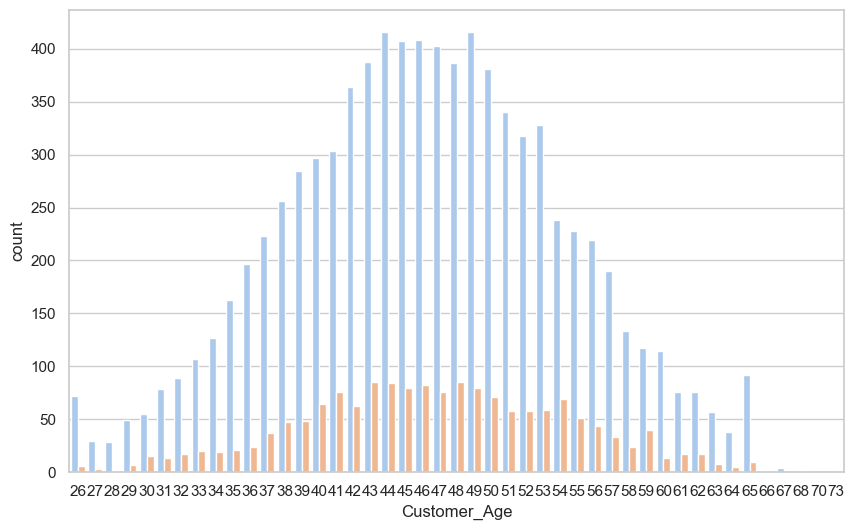

In [394]:
# Create a stacked bar chart
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Customer_Age', hue='Attrition_Customer', palette='pastel')
plt.title('Attrition by Gender')
plt.xlabel('Attrition Customer')
plt.ylabel('Count')
plt.show()

# Men and Women both maintain higher balances but woman have a higher presence in Avg Utilization

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Avg_Utilization_Ratio', ylabel='Total_Revolving_Bal'>

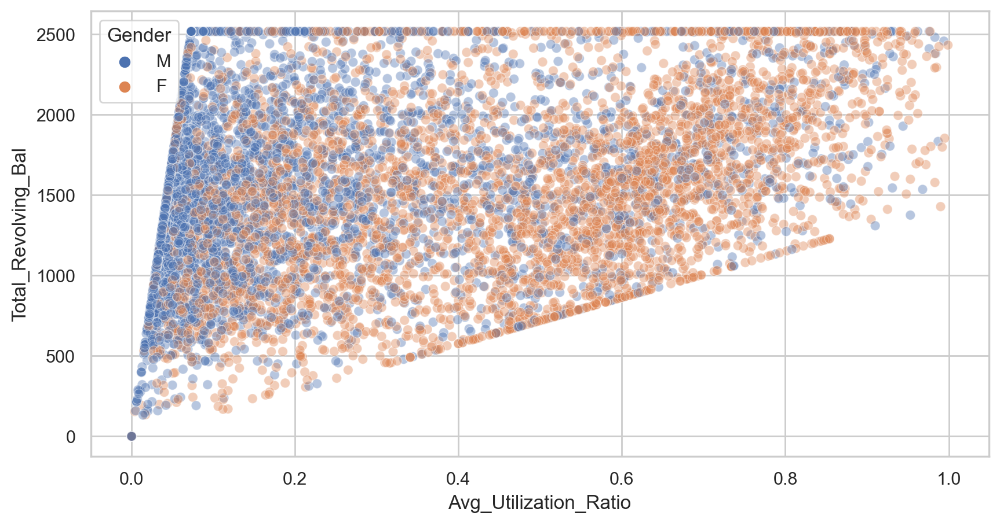

In [369]:
plt.figure(figsize=(10,5),dpi=200)
sns.scatterplot(data=df, x='Avg_Utilization_Ratio', y='Total_Revolving_Bal', hue='Gender',
               alpha=0.4)

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Avg_Utilization_Ratio', ylabel='Total_Trans_Amt'>

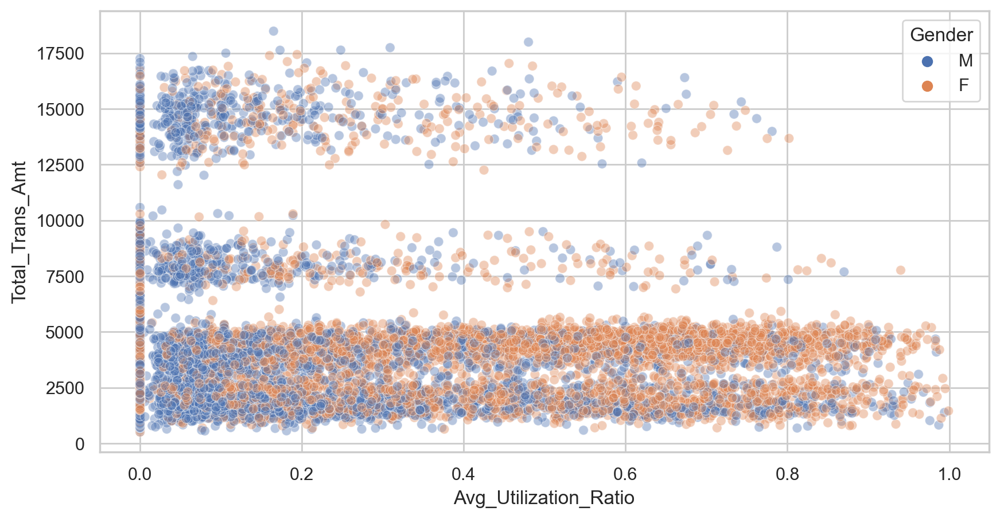

In [377]:
plt.figure(figsize=(10,5),dpi=200)
sns.scatterplot(data=df, x='Avg_Utilization_Ratio', y='Total_Trans_Amt', hue='Gender',
               alpha=0.4)

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Avg_Utilization_Ratio', ylabel='Total_Trans_Ct'>

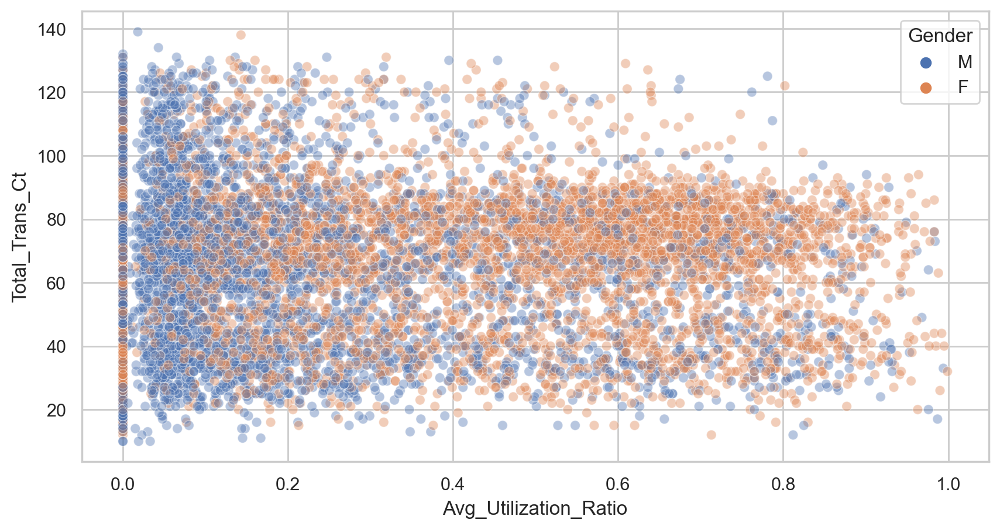

In [368]:
plt.figure(figsize=(10,5),dpi=200)
sns.scatterplot(data=df, x='Avg_Utilization_Ratio', y='Total_Trans_Ct', hue='Gender',
               alpha=0.4)

# High concentration pocket of attrition from customers with low Total Revolving Balances under $500
# This shows there's a higher chance of a customer staying with their credit card if they spend more money on it. 

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Avg_Utilization_Ratio', ylabel='Total_Revolving_Bal'>

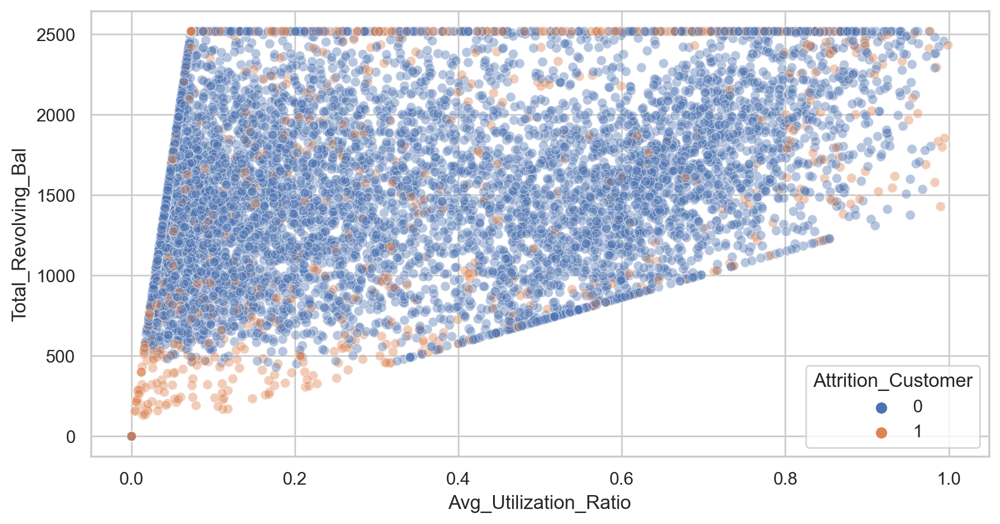

In [127]:
plt.figure(figsize=(10,5),dpi=200)
sns.scatterplot(data=df, x='Avg_Utilization_Ratio', y='Total_Revolving_Bal', hue='Attrition_Customer',
               alpha=0.4)

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Axes: xlabel='Avg_Utilization_Ratio', ylabel='Total_Trans_Ct'>

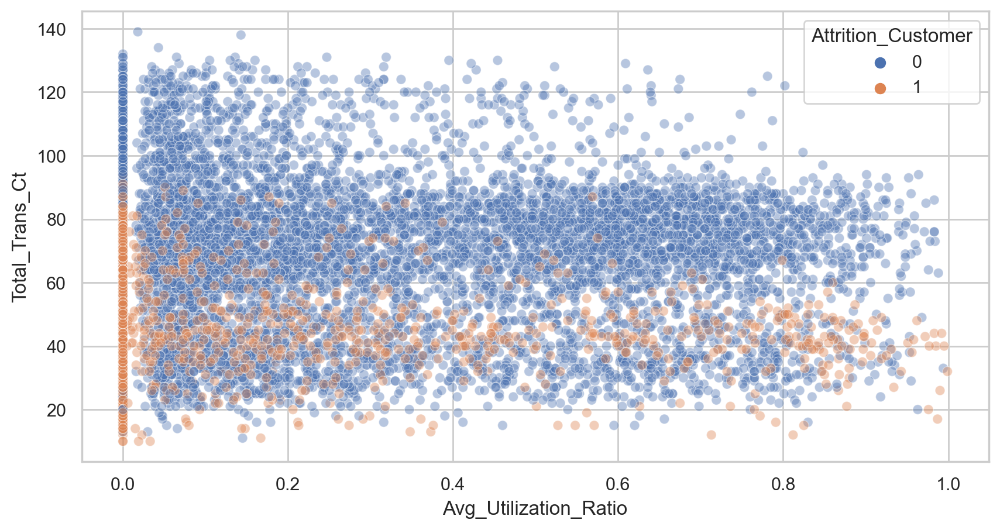

In [370]:
plt.figure(figsize=(10,5),dpi=200)
sns.scatterplot(data=df, x='Avg_Utilization_Ratio', y='Total_Trans_Ct', hue='Attrition_Customer',
               alpha=0.4)

# Final check for trends between existing and attrited with KDE
# High amount of people canceling around the 36 month mark. Potentially due to beneficial terms ending around that time or the system cancels cards after 3 years of high inactivity

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will 

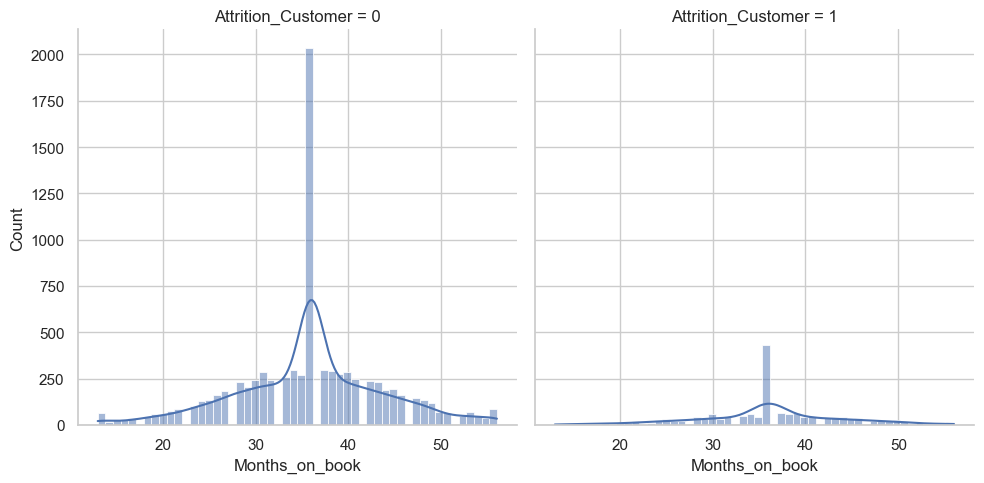

In [39]:
# Set the style
sns.set(style="whitegrid")

# Create a distribution plot for 'Months_on_book' with separate columns for 'Existing_Customer'
sns.displot(df, x='Months_on_book', col='Attrition_Customer', kde=True)
plt.show()

In [156]:
df.head(30)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code,Attrition_Customer
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,1,0,0,0,1,0,0,1,0
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,1,0,0,0,0,0,1,0,2,0
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,1,0,0,0,0,1,0,0,1,0
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,1,0,0,0,0,0,1,2,0
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,1,0,1,0,0,1,0
5,Existing Customer,44,M,2,Blue,36,3,1,2,4010.0,...,1,0,0,0,0,1,0,0,1,0
6,Existing Customer,51,M,4,Gold,46,6,1,3,34516.0,...,0,0,0,0,1,1,0,0,1,0
7,Existing Customer,32,M,0,Silver,27,2,2,2,29081.0,...,0,1,0,0,0,0,0,1,1,0
8,Existing Customer,37,M,3,Blue,36,5,2,0,22352.0,...,0,0,0,1,0,0,1,0,1,0
9,Existing Customer,48,M,2,Blue,36,6,3,3,11656.0,...,1,0,0,0,0,0,1,0,1,0


# Features to be used and trained on models based on EDA insights
# 'Contacts_Count_12_mon', 'Months_Inactive_12_mon', 'Gender_Code', 'Marital_Status_Single','Dependent_count', 'Customer_Age', 'Avg_Open_To_Buy','Credit_Limit', 'Avg_Utilization_Ratio','Total_Trans_Amt','Total_Trans_Ct'

In [180]:
df['Attrition_Customer'].isna().sum()


0

# Begin first simple model
# Logistic Regression

In [250]:
X = df[['Contacts_Count_12_mon', 'Months_Inactive_12_mon', 'Gender_Code', 'Marital_Status_Single',
        'Dependent_count', 'Customer_Age', 'Avg_Open_To_Buy','Credit_Limit', 'Avg_Utilization_Ratio',
        'Total_Trans_Amt','Total_Trans_Ct','Total_Revolving_Bal','Months_on_book']]


In [251]:
y = df['Attrition_Customer']

In [252]:
from sklearn.model_selection import train_test_split

In [253]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=23)

In [254]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, confusion_matrix

In [255]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression



In [256]:
logreg = LogisticRegression()


# Define hyperparameters to tune
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

# Create GridSearchCV
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')

# Fit the model on the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and the best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Print the best parameters
print("Best Parameters:", best_params)

# Predictions on the test set
y_pred = best_estimator.predict(X_test)



/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/mod

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/mod

Best Parameters: {'C': 10}


/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/mod

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      2549
           1       0.68      0.46      0.55       490

    accuracy                           0.88      3039
   macro avg       0.79      0.71      0.74      3039
weighted avg       0.87      0.88      0.87      3039



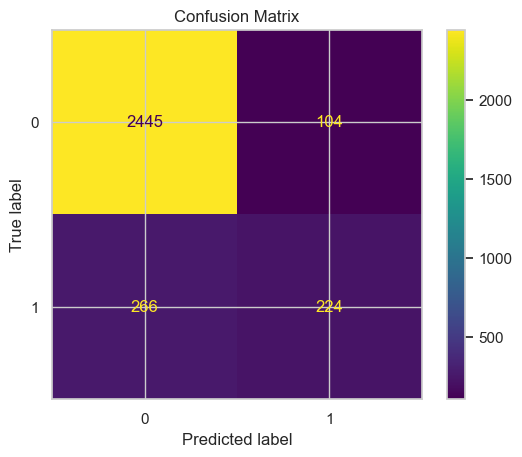

In [257]:
# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels=best_estimator.classes_).plot()
plt.title('Confusion Matrix')
plt.show()


# 2nd Model: 
# Single Decision Tree

In [258]:
from sklearn.tree import DecisionTreeClassifier

In [259]:
# Define the parameter grid
param_grid = {
    'max_depth': [None, 5,10,15,20],  # You can adjust these values based on your data
}

# Create a Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=23)

# Create GridSearchCV object
grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='f1', verbose=1, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters
print("Best Parameters: ", grid_search.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Parameters:  {'max_depth': 10}


In [260]:
dt = DecisionTreeClassifier(max_depth=10)

In [261]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10)

In [262]:
preds = dt.predict(X_test)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2549
           1       0.80      0.77      0.78       490

    accuracy                           0.93      3039
   macro avg       0.88      0.86      0.87      3039
weighted avg       0.93      0.93      0.93      3039



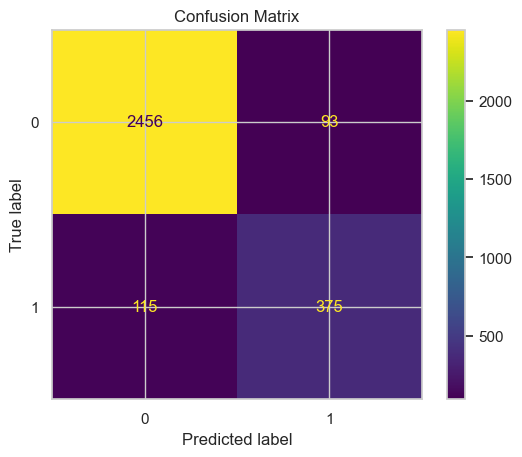

In [264]:
print(classification_report(y_test,preds))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, preds)
ConfusionMatrixDisplay(conf_matrix, display_labels=best_estimator.classes_).plot()
plt.title('Confusion Matrix')
plt.show()


# Feature Importance

In [265]:
imp_feats = pd.DataFrame(data=dt.feature_importances_, index=X.columns, columns=['Feature Importance'] )

In [267]:
imp_feats

,Feature Importance
Contacts_Count_12_mon,0.042300
Months_Inactive_12_mon,0.028474
Gender_Code,0.014143
Marital_Status_Single,0.008340
Dependent_count,0.002545
Customer_Age,0.045889
Avg_Open_To_Buy,0.045496
Credit_Limit,0.015788
Avg_Utilization_Ratio,0.007533
Total_Trans_Amt,0.224159


/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'Contacts_Count_12_mon'),
  Text(1, 0, 'Months_Inactive_12_mon'),
  Text(2, 0, 'Gender_Code'),
  Text(3, 0, 'Marital_Status_Single'),
  Text(4, 0, 'Dependent_count'),
  Text(5, 0, 'Customer_Age'),
  Text(6, 0, 'Avg_Open_To_Buy'),
  Text(7, 0, 'Credit_Limit'),
  Text(8, 0, 'Avg_Utilization_Ratio'),
  Text(9, 0, 'Total_Trans_Amt'),
  Text(10, 0, 'Total_Trans_Ct'),
  Text(11, 0, 'Total_Revolving_Bal'),
  Text(12, 0, 'Months_on_book')])

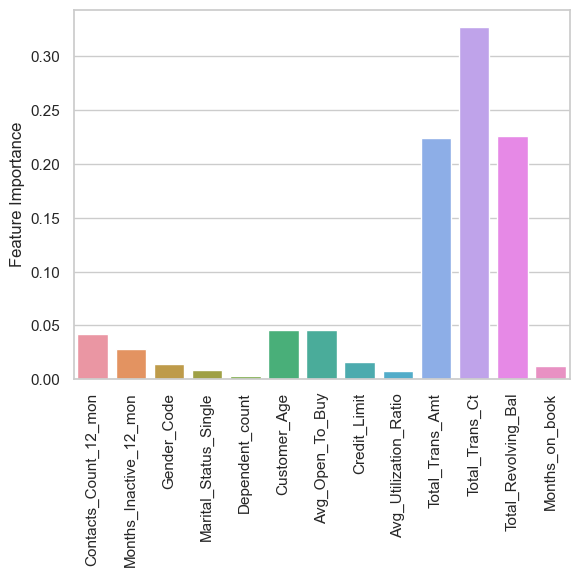

In [268]:
sns.barplot(data=imp_feats, x=imp_feats.index, y='Feature Importance')
plt.xticks(rotation=90)

[Text(0.5841681618819776, 0.9545454545454546, 'x[10] <= 55.5\ngini = 0.269\nsamples = 7088\nvalue = [5951, 1137]'),
 Text(0.3018590510366826, 0.8636363636363636, 'x[11] <= 672.5\ngini = 0.466\nsamples = 2468\nvalue = [1558, 910]'),
 Text(0.12988437001594896, 0.7727272727272727, 'x[9] <= 1843.5\ngini = 0.396\nsamples = 826\nvalue = [225, 601]'),
 Text(0.046052631578947366, 0.6818181818181818, 'x[9] <= 1051.0\ngini = 0.499\nsamples = 307\nvalue = [147, 160]'),
 Text(0.006379585326953748, 0.5909090909090909, 'x[0] <= 0.5\ngini = 0.057\nsamples = 68\nvalue = [2, 66]'),
 Text(0.003189792663476874, 0.5, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.009569377990430622, 0.5, 'x[6] <= 15206.0\ngini = 0.029\nsamples = 67\nvalue = [1, 66]'),
 Text(0.006379585326953748, 0.4090909090909091, 'gini = 0.0\nsamples = 59\nvalue = [0, 59]'),
 Text(0.012759170653907496, 0.4090909090909091, 'x[2] <= 1.5\ngini = 0.219\nsamples = 8\nvalue = [1, 7]'),
 Text(0.009569377990430622, 0.3181818181818182, 'gin

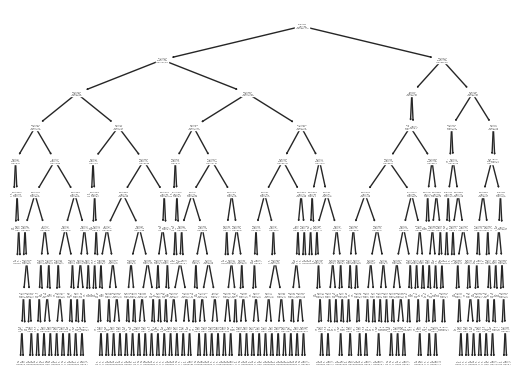

In [289]:
from sklearn.tree import plot_tree
plot_tree(dt)

In [312]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code,Attrition_Customer
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,1,0,0,0,1,0,0,1,0
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,1,0,0,0,0,0,1,0,2,0
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,1,0,0,0,0,1,0,0,1,0
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,1,0,0,0,0,0,1,2,0
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,1,0,1,0,0,1,0


# Random Forest Classifier Model
# 94% Accuracy

In [318]:
from sklearn.ensemble import RandomForestClassifier

In [319]:
rf = RandomForestClassifier(max_depth=10)

In [320]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [322]:
rf_preds = rf.predict(X_test)

In [323]:
print(classification_report(y_test,rf_preds))


              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2549
           1       0.90      0.73      0.81       490

    accuracy                           0.94      3039
   macro avg       0.92      0.86      0.89      3039
weighted avg       0.94      0.94      0.94      3039



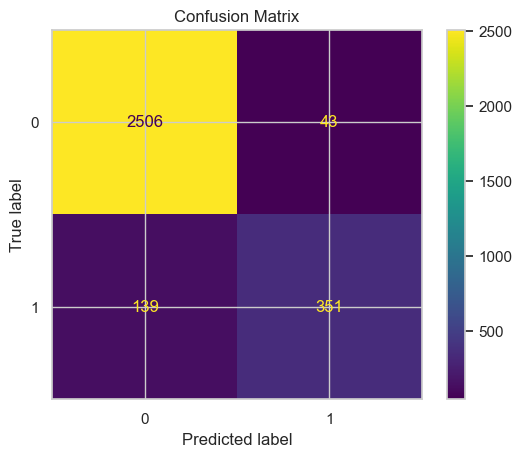

In [295]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, rf_preds)
ConfusionMatrixDisplay(conf_matrix, display_labels=best_estimator.classes_).plot()
plt.title('Confusion Matrix')
plt.show()

# Random Forest Classifier with Grid Search
# Improved Recall @ 76%

In [324]:
# Define the parameter grid for Random Forest Classifier
param_grid_rf = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 5, 10, 15],     # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],    # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]       
}

In [325]:

rf_classifier = RandomForestClassifier(random_state=23)


grid_search_rf = GridSearchCV(rf_classifier, param_grid_rf, cv=5, scoring='recall', verbose=1, n_jobs=-1)


grid_search_rf.fit(X_train, y_train)


print("Best Parameters (Random Forest): ", grid_search_rf.best_params_)


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best Parameters (Random Forest):  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}


In [326]:
# Use the best parameter for the Random Forest Classifier 
rf_best = RandomForestClassifier(**grid_search_rf.best_params_, random_state=23)
rf_best.fit(X_train, y_train)

# Predictions
rf_best_preds = rf_best.predict(X_test)


print("Classification Report (Random Forest):")
print(classification_report(y_test, rf_best_preds))

Classification Report (Random Forest):
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2549
           1       0.89      0.76      0.82       490

    accuracy                           0.95      3039
   macro avg       0.92      0.87      0.90      3039
weighted avg       0.95      0.95      0.95      3039



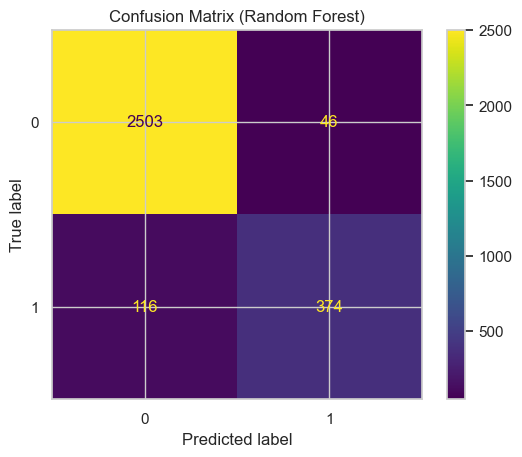

In [327]:
# Confusion Matrix
conf_matrix_rf = confusion_matrix(y_test, rf_best_preds)
ConfusionMatrixDisplay(conf_matrix_rf, display_labels=rf_best.classes_).plot()
plt.title('Confusion Matrix (Random Forest)')
plt.show()

In [358]:
df.head(15)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Gender_Code,Attrition_Customer
0,Existing Customer,45,M,3,Blue,39,5,1,3,12691.0,...,0,1,0,0,0,1,0,0,1,0
1,Existing Customer,49,F,5,Blue,44,6,1,2,8256.0,...,1,0,0,0,0,0,1,0,2,0
2,Existing Customer,51,M,3,Blue,36,4,1,0,3418.0,...,1,0,0,0,0,1,0,0,1,0
3,Existing Customer,40,F,4,Blue,34,3,4,1,3313.0,...,0,1,0,0,0,0,0,1,2,0
4,Existing Customer,40,M,3,Blue,21,5,1,0,4716.0,...,0,0,0,1,0,1,0,0,1,0
5,Existing Customer,44,M,2,Blue,36,3,1,2,4010.0,...,1,0,0,0,0,1,0,0,1,0
6,Existing Customer,51,M,4,Gold,46,6,1,3,34516.0,...,0,0,0,0,1,1,0,0,1,0
7,Existing Customer,32,M,0,Silver,27,2,2,2,29081.0,...,0,1,0,0,0,0,0,1,1,0
8,Existing Customer,37,M,3,Blue,36,5,2,0,22352.0,...,0,0,0,1,0,0,1,0,1,0
9,Existing Customer,48,M,2,Blue,36,6,3,3,11656.0,...,1,0,0,0,0,0,1,0,1,0


# Ada Boost Classifier Model
# 94% Accurancy

In [296]:
from sklearn.ensemble import AdaBoostClassifier

In [307]:
ada_model = AdaBoostClassifier(n_estimators=100)

In [308]:
ada_model.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=100)

In [309]:
ada_preds = ada_model.predict(X_test)

In [310]:
print(classification_report(y_test,ada_preds))



              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2549
           1       0.85      0.78      0.82       490

    accuracy                           0.94      3039
   macro avg       0.91      0.88      0.89      3039
weighted avg       0.94      0.94      0.94      3039



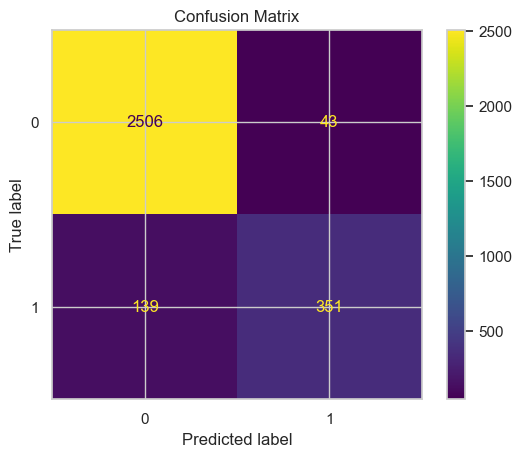

In [301]:
# Confusion Matrix
ada_conf_matrix = confusion_matrix(y_test, ada_preds)
ConfusionMatrixDisplay(conf_matrix, display_labels=best_estimator.classes_).plot()
plt.title('Confusion Matrix')
plt.show()

# Ada Boost Classifier with Grid Search
# Recall @ 78%

In [329]:
# parameter grid
param_grid_ada = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
}


ada_classifier = AdaBoostClassifier(random_state=23)

# GridSearchCV 
grid_search_ada = GridSearchCV(ada_classifier, param_grid_ada, cv=5, scoring='recall', verbose=1, n_jobs=-1)

# Fit 
grid_search_ada.fit(X_train, y_train)


print("Best Parameters: ", grid_search_ada.best_params_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best Parameters:  {'learning_rate': 1.0, 'n_estimators': 150}


In [330]:
# best parameters
best_ada_estimator = AdaBoostClassifier(**grid_search_ada.best_params_, random_state=23)

# Fit training data
best_ada_estimator.fit(X_train, y_train)

# Predictions data
ada_preds = best_ada_estimator.predict(X_test)


print(classification_report(y_test, ada_preds))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2549
           1       0.86      0.78      0.82       490

    accuracy                           0.94      3039
   macro avg       0.91      0.88      0.89      3039
weighted avg       0.94      0.94      0.94      3039



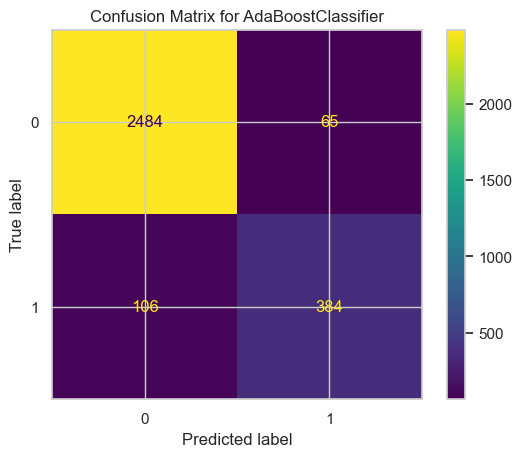

In [331]:
# Confusion Matrix
ada_conf_matrix = confusion_matrix(y_test, ada_preds)
ConfusionMatrixDisplay(ada_conf_matrix, display_labels=best_ada_estimator.classes_).plot()
plt.title('Confusion Matrix for AdaBoostClassifier')
plt.show()


# Gradient Boosting Classifier Model
# 95% accuracy / recall 78%

In [302]:
gb_model = GradientBoostingClassifier()

In [303]:
gb_model.fit(X_train, y_train)

GradientBoostingClassifier()

In [304]:
gb_pred = gb_model.predict(X_test)

In [305]:
print(classification_report(y_test,gb_pred))



              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2549
           1       0.88      0.78      0.83       490

    accuracy                           0.95      3039
   macro avg       0.92      0.88      0.90      3039
weighted avg       0.95      0.95      0.95      3039



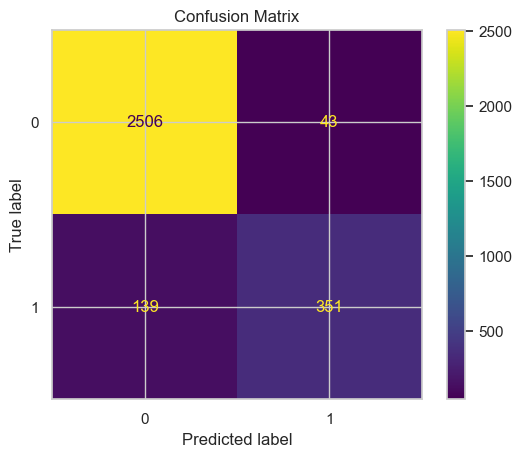

In [378]:
# Confusion Matrix
gb_conf_matrix = confusion_matrix(y_test, gb_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels=best_estimator.classes_).plot()
plt.title('Confusion Matrix')
plt.show()

# Gradient Boosting Classifier with Grid Search
# 95% accuracy / recall 80%

In [337]:
# Define the parameter grid
param_grid_gb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'max_depth': [3, 5, 7]
}

# Create GradientBoostingClassifier
gb_classifier = GradientBoostingClassifier(random_state=23)

# Create GridSearchCV object
grid_search_gb = GridSearchCV(gb_classifier, param_grid_gb, cv=5, scoring='recall', verbose=1, n_jobs=-1)

# Fit the grid search to the data
grid_search_gb.fit(X_train, y_train)

# Print the best parameters
print("Best Parameters: ", grid_search_gb.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters:  {'learning_rate': 0.5, 'max_depth': 7, 'n_estimators': 100}


In [379]:
# Create GradientBoostingClassifier with the best parameters
gb_gs_model = GradientBoostingClassifier(**grid_search_gb.best_params_, random_state=23)

# Fit the model on the training data
gb_gs_model.fit(X_train, y_train)

# Predictions on the test data
gb_preds = gb_gs_model.predict(X_test)

# Display the classification report
print(classification_report(y_test, gb_preds))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2549
           1       0.86      0.80      0.83       490

    accuracy                           0.95      3039
   macro avg       0.91      0.89      0.90      3039
weighted avg       0.95      0.95      0.95      3039



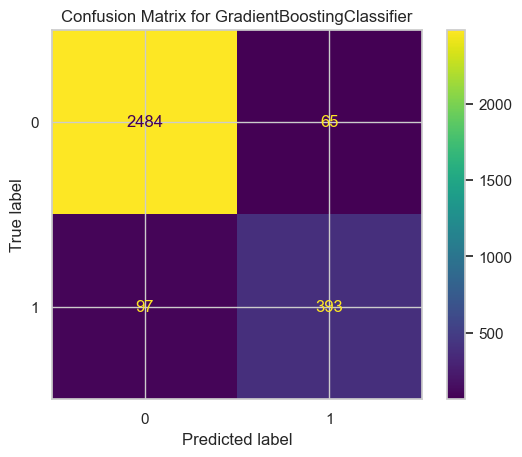

In [380]:
# Confusion Matrix
gb_conf_matrix = confusion_matrix(y_test, gb_preds)
ConfusionMatrixDisplay(gb_conf_matrix, display_labels=best_gb_estimator.classes_).plot()
plt.title('Confusion Matrix for GradientBoostingClassifier')
plt.show()

# Gradient Boosting Classifier with Grid Search turned out to be the best model due to best precision and accuracy scores

In [347]:
final_model = grid_search_gb

In [348]:
final_model.fit(X,y)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=23),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.5, 1.0],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='recall', verbose=1)

# Finalizing The Model

In [349]:
import joblib

In [350]:
joblib.dump(final_model, 'final_model.pkl')

['final_model.pkl']

In [351]:
list(X.columns)

['Contacts_Count_12_mon',
 'Months_Inactive_12_mon',
 'Gender_Code',
 'Marital_Status_Single',
 'Dependent_count',
 'Customer_Age',
 'Avg_Open_To_Buy',
 'Credit_Limit',
 'Avg_Utilization_Ratio',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Revolving_Bal',
 'Months_on_book']

In [352]:
joblib.dump(list(X.columns),'col_names.pkl')

['col_names.pkl']

# Loading The Model

In [354]:
new_columns = joblib.load('col_names.pkl')

In [355]:
new_columns

['Contacts_Count_12_mon',
 'Months_Inactive_12_mon',
 'Gender_Code',
 'Marital_Status_Single',
 'Dependent_count',
 'Customer_Age',
 'Avg_Open_To_Buy',
 'Credit_Limit',
 'Avg_Utilization_Ratio',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Revolving_Bal',
 'Months_on_book']

In [357]:
loaded_model = joblib.load('final_model.pkl')

In [359]:
loaded_model.predict([[3,1,1,0,3,45,11914,12691,0.061,1144,42,777,39]])

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([0])

In [365]:
loaded_model.predict([[3,1,1,0,3,45,250,250,0.061,70,2,23,39]])

/Users/ronnie/anaconda3/envs/ronnie_dsc/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


array([1])